In [1]:
#importing the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

# set to display all the columns in dataset
pd.set_option("display.max_columns", None)

# to run sql queries on dataframe
import pandasql as psql

In [2]:
#load the claims data

bankdata= pd.read_csv(r"C:\dataset\bank-direct-marketing-campaigns.csv", header=0)
#copy to back-up file
bankdata_bk=bankdata.copy()

#display first five records
bankdata.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [3]:
#display the dataset information
bankdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

In [4]:
# Display Duplicate values within dataset

bankdata_d=bankdata[bankdata.duplicated(keep='last')]

#Display the duplicate records

bankdata_d

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
14,35,blue-collar,married,basic.6y,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
21,55,blue-collar,married,basic.4y,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39979,27,admin.,single,high.school,no,no,no,cellular,jun,tue,2,999,0,nonexistent,-1.7,94.055,-39.8,0.761,4991.6,yes
40399,31,student,single,unknown,no,yes,no,cellular,aug,thu,2,999,0,nonexistent,-1.7,94.027,-38.3,0.904,4991.6,yes
40402,41,entrepreneur,married,university.degree,no,yes,no,cellular,aug,thu,1,999,0,nonexistent,-1.7,94.027,-38.3,0.904,4991.6,yes
40804,35,technician,married,professional.course,no,yes,no,cellular,sep,thu,1,999,2,failure,-1.1,94.199,-37.5,0.878,4963.6,no


In [5]:
# Remove the identified duplicate records

bankdata.drop_duplicates()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [6]:
#display the missing values information of variables

bankdata.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [7]:
#Display the unique values of the all the variables

bankdata.nunique()

age                78
job                12
marital             4
education           8
default             3
housing             3
loan                3
contact             2
month              10
day_of_week         5
campaign           42
pdays              27
previous            8
poutcome            3
emp.var.rate       10
cons.price.idx     26
cons.conf.idx      26
euribor3m         316
nr.employed        11
y                   2
dtype: int64

In [8]:
bankdata.describe()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [9]:
#deleting the variable which is not influencing the target variable

del bankdata['job']

In [10]:
#coverting string datatype to integer 

from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
bankdata['marital']=LE.fit_transform(bankdata['marital'])
bankdata['education']=LE.fit_transform(bankdata['education'])
bankdata['default']=LE.fit_transform(bankdata['default'])
bankdata['housing']=LE.fit_transform(bankdata['housing'])
bankdata['loan']=LE.fit_transform(bankdata['loan'])
bankdata['contact']=LE.fit_transform(bankdata['contact'])
bankdata['month']=LE.fit_transform(bankdata['month'])
bankdata['day_of_week']=LE.fit_transform(bankdata['day_of_week'])
bankdata['poutcome']=LE.fit_transform(bankdata['poutcome'])
bankdata['y']=LE.fit_transform(bankdata['y'])


In [11]:
#display the dataset information

bankdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   marital         41188 non-null  int32  
 2   education       41188 non-null  int32  
 3   default         41188 non-null  int32  
 4   housing         41188 non-null  int32  
 5   loan            41188 non-null  int32  
 6   contact         41188 non-null  int32  
 7   month           41188 non-null  int32  
 8   day_of_week     41188 non-null  int32  
 9   campaign        41188 non-null  int64  
 10  pdays           41188 non-null  int64  
 11  previous        41188 non-null  int64  
 12  poutcome        41188 non-null  int32  
 13  emp.var.rate    41188 non-null  float64
 14  cons.price.idx  41188 non-null  float64
 15  cons.conf.idx   41188 non-null  float64
 16  euribor3m       41188 non-null  float64
 17  nr.employed     41188 non-null 

In [12]:
#count the target or dependent variable by 0 & 1 and their proportion
#(>=10:1,then the datset is imbalance data)
y_count=bankdata.y.value_counts()
print("class 0:",y_count[0])
print("class 1:",y_count[1])
print("Proportion:",round(y_count[0]/y_count[1],2),':1')
print("Total Bank records:",len(bankdata))

class 0: 36548
class 1: 4640
Proportion: 7.88 :1
Total Bank records: 41188


In [13]:
#Display all the variables

bankdata.columns

Index(['age', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y'],
      dtype='object')

In [14]:
#Identify the independent and Target (dependent) variables

indepvar=[]
for col in bankdata.columns:
    if col!='y':
        indepvar.append(col)
tarvar='y'
x=bankdata[indepvar]
y=bankdata[tarvar]

In [15]:
#Split the data into train and test (random sampling)

from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=42)

#Display the shape for train & test data

x_train.shape,x_test.shape,y_train.shape,y_test.shape

((28831, 18), (12357, 18), (28831,), (12357,))

In [ ]:
# Scaling the features by using minmaxscales

from sklearn.preprocessing import MinMaxScaler
mmscaler=MinMaxScaler(feature_range=(0, 1))

x_train=mmscaler.fit_transform(x_train)
x_train=pd.DataFrame(x_train) 

x_test=mmscaler.fit_transform(x_test)
x_test=pd.DataFrame(x_test)

# Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression

# Create an object for regression model

ModelLR = LogisticRegression()

# Train the model with training dataset

ModelLR.fit(x_train, y_train)

# Predict the model with test dataset

y_pred = ModelLR.predict(x_test)
y_pred_prob = ModelLR.predict_proba(x_test)

In [18]:
# confusion matrix and classification matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# actual values
actual=y_test
# predicted values 
predicted=y_pred
matrix=confusion_matrix(actual,predicted,labels=[1,0],sample_weight=None,normalize=None)
print('Confusion matrix:\n',matrix)

Confusion matrix:
 [[  304  1085]
 [  155 10813]]


In [19]:
# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

Outcome values : 
 304 1085 155 10813
Classification report : 
               precision    recall  f1-score   support

           1       0.66      0.22      0.33      1389
           0       0.91      0.99      0.95     10968

    accuracy                           0.90     12357
   macro avg       0.79      0.60      0.64     12357
weighted avg       0.88      0.90      0.88     12357



In [20]:
# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

Accuracy : 90.0 %
Precision : 66.2 %
Recall : 21.9 %
F1 Score : 0.329
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 60.2 %
MCC : 0.342


roc_auc_score: 0.602


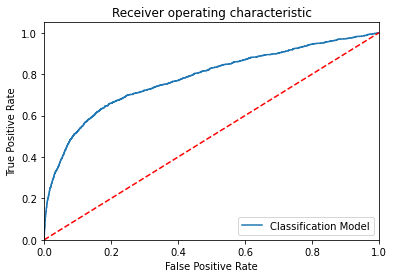

-----------------------------------------------------------------------------------------------------


In [21]:
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelLR.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [45]:
# display the final results

Results = pd.DataFrame({'y_A':y_test,'y_P':y_pred})
                      
# merge two dataframes on index of the both dataframes

ResultsFinal = bankdata_bk.merge(Results,left_index=True,right_index=True)

# display 5 records randomly

ResultsFinal.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,y_A,y_P
9242,48,blue-collar,married,basic.6y,no,no,no,telephone,jun,fri,1,999,0,nonexistent,1.4,94.465,-41.8,4.967,5228.1,no,0,0
31191,35,blue-collar,single,basic.9y,no,yes,no,cellular,may,wed,1,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1,no,0,0
24267,39,admin.,married,university.degree,no,yes,no,cellular,nov,mon,2,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no,0,0
29102,53,blue-collar,married,basic.9y,no,no,yes,telephone,apr,fri,1,999,1,failure,-1.8,93.075,-47.1,1.405,5099.1,no,0,1
37488,24,student,single,high.school,no,no,no,cellular,aug,thu,1,999,2,failure,-2.9,92.201,-31.4,0.873,5076.2,no,0,1


# Decision Tree Classifier

In [22]:
from sklearn.tree import DecisionTreeClassifier

# Create an object for regression model

ModelDT = DecisionTreeClassifier()

# Train the model with training dataset

ModelDT.fit(x_train, y_train)

# Predict the model with test dataset

y_pred = ModelDT.predict(x_test)
y_pred_prob = ModelDT.predict_proba(x_test)

In [24]:
params = ModelDT.get_params()
print(params)

{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


Confusion matrix:
 [[ 470  919]
 [1140 9828]]
Outcome values:
 470 919 1140 9828
Classification report : 
               precision    recall  f1-score   support

           1       0.29      0.34      0.31      1389
           0       0.91      0.90      0.91     10968

    accuracy                           0.83     12357
   macro avg       0.60      0.62      0.61     12357
weighted avg       0.84      0.83      0.84     12357

Accuracy : 83.3 %
Precision : 29.2 %
Recall : 33.8 %
F1 Score : 0.313
Specificity or True Negative Rate : 89.6 %
Balanced Accuracy : 61.7 %
MCC : 0.22
roc_auc_score: 0.617


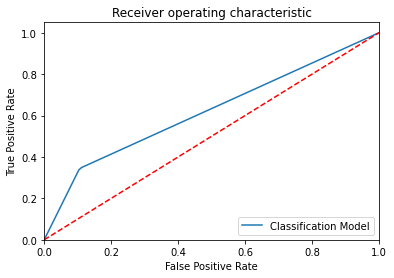

-----------------------------------------------------------------------------------------------------


In [25]:
# confusion matrix and classification matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
# actual values
actual=y_test
# predicted values 
predicted=y_pred
matrix=confusion_matrix(actual,predicted,labels=[1,0],sample_weight=None,normalize=None)
print('Confusion matrix:\n',matrix)
tp,fn,fp,tn=confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values:\n',tp,fn,fp,tn)
# 'Confusion matrix' and 'classification report' in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test
# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelDT.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

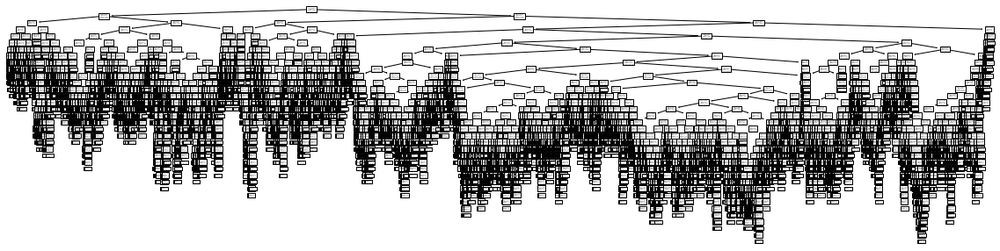

In [26]:
#plot the tree
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20,5))
tree.plot_tree(ModelDT);

In [27]:
# display the final results

Results = pd.DataFrame({'y_A':y_test,'y_P':y_pred})
                      
# merge two dataframes on index of the both dataframes

ResultsFinal = bankdata_bk.merge(Results,left_index=True,right_index=True)

# display 5 records randomly

ResultsFinal.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,y_A,y_P
12005,52,technician,married,basic.9y,no,yes,yes,telephone,jun,thu,3,999,0,nonexistent,1.4,94.465,-41.8,4.955,5228.1,no,0,0
15044,49,technician,divorced,high.school,no,no,no,cellular,jul,thu,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,no,0,0
36388,43,admin.,married,university.degree,no,yes,no,cellular,jun,tue,1,999,0,nonexistent,-2.9,92.963,-40.8,1.262,5076.2,no,0,1
11911,36,blue-collar,married,professional.course,unknown,yes,no,telephone,jun,fri,2,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no,0,0
9731,28,blue-collar,single,basic.9y,no,yes,no,telephone,jun,mon,2,999,0,nonexistent,1.4,94.465,-41.8,4.961,5228.1,no,0,0


# Random Forest

Confusion matrix : 
 [[  422   967]
 [  486 10482]]
Outcome values : 
 422 967 486 10482
Classification report : 
               precision    recall  f1-score   support

           1       0.46      0.30      0.37      1389
           0       0.92      0.96      0.94     10968

    accuracy                           0.88     12357
   macro avg       0.69      0.63      0.65     12357
weighted avg       0.86      0.88      0.87     12357

Accuracy : 88.2 %
Precision : 46.5 %
Recall : 30.4 %
F1 Score : 0.367
Specificity or True Negative Rate : 95.6 %
Balanced Accuracy : 63.0 %
MCC : 0.314
roc_auc_score: 0.63


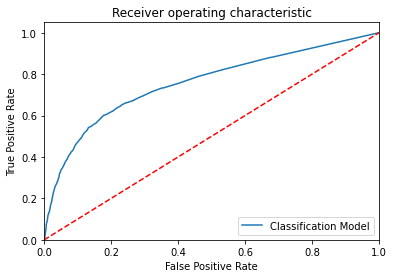

-----------------------------------------------------------------------------------------------------


In [28]:
#==Step_01=============================================================================================================>

# To build the 'Random Forest' model with random sampling

from sklearn.ensemble import ExtraTreesClassifier

# Create an object for Extra Trees Classifier 

ModelET = ExtraTreesClassifier()

# Train the model with train data 

ModelET.fit(x_train,y_train)

# Predict the model with test data set

y_pred = ModelET.predict(x_test)
y_pred_prob = ModelET.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual, predicted, labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelET.predict_proba(x_test)[:,1])
plt.figure()
#--------------------------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')


In [29]:
#Display all the variables

bankdata.columns

Index(['age', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y'],
      dtype='object')

In [30]:
figcols=['age', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m',
       'nr.employed', 'y']

# Extra Trees Classifier

In [31]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')


In [32]:
# display the final results

Results = pd.DataFrame({'y_A':y_test,'y_P':y_pred})
                      
# merge two dataframes on index of the both dataframes

ResultsFinal = bankdata_bk.merge(Results,left_index=True,right_index=True)

# display 5 records randomly

ResultsFinal.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,y_A,y_P
31126,57,admin.,married,high.school,no,no,no,cellular,may,wed,1,999,1,failure,-1.8,92.893,-46.2,1.334,5099.1,no,0,0
12277,50,entrepreneur,married,professional.course,no,yes,no,telephone,jul,thu,2,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no,0,0
6633,57,housemaid,divorced,basic.4y,unknown,yes,no,telephone,may,wed,3,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,0
24088,29,admin.,married,basic.9y,no,yes,no,telephone,nov,fri,1,999,0,nonexistent,-0.1,93.200,-42.0,4.474,5195.8,yes,1,1
19345,51,entrepreneur,married,basic.9y,no,no,no,cellular,aug,wed,1,999,0,nonexistent,1.4,93.444,-36.1,4.967,5228.1,no,0,0


# KNN

In [33]:
KNN_Results = pd.read_csv(r"C:\dataset\KNN_Results.csv",header=0)
KNN_Results.head()

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


KNN_K_value =  1
Model Name:  KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[  428   961]
 [  943 10025]]
Outcome values : 
 428 961 943 10025
Classification report : 
               precision    recall  f1-score   support

           1       0.31      0.31      0.31      1389
           0       0.91      0.91      0.91     10968

    accuracy                           0.85     12357
   macro avg       0.61      0.61      0.61     12357
weighted avg       0.85      0.85      0.85     12357

Accuracy : 84.6 %
Precision : 31.2 %
Recall : 30.8 %
F1 Score : 0.31
Specificity or True Negative Rate : 91.4 %
Balanced Accuracy : 61.1 %
MCC : 0.223
roc_auc_score: 0.611


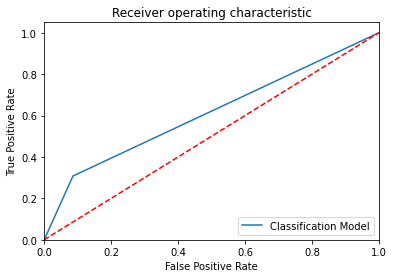

KNN_K_value =  2
Model Name:  KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[  219  1170]
 [  202 10766]]
Outcome values : 
 219 1170 202 10766
Classification report : 
               precision    recall  f1-score   support

           1       0.52      0.16      0.24      1389
           0       0.90      0.98      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.71      0.57      0.59     12357
weighted avg       0.86      0.89      0.86     12357

Accuracy : 88.9 %
Precision : 52.0 %
Recall : 15.8 %
F1 Score : 0.242
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 57.0 %
MCC : 0.242
roc_auc_score: 0.57


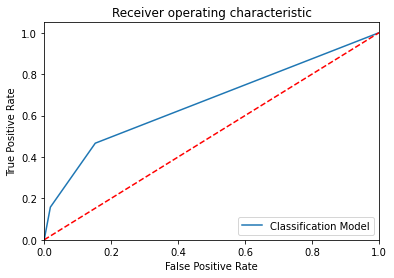

KNN_K_value =  3
Model Name:  KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[  393   996]
 [  443 10525]]
Outcome values : 
 393 996 443 10525
Classification report : 
               precision    recall  f1-score   support

           1       0.47      0.28      0.35      1389
           0       0.91      0.96      0.94     10968

    accuracy                           0.88     12357
   macro avg       0.69      0.62      0.64     12357
weighted avg       0.86      0.88      0.87     12357

Accuracy : 88.4 %
Precision : 47.0 %
Recall : 28.3 %
F1 Score : 0.353
Specificity or True Negative Rate : 96.0 %
Balanced Accuracy : 62.1 %
MCC : 0.305
roc_auc_score: 0.621


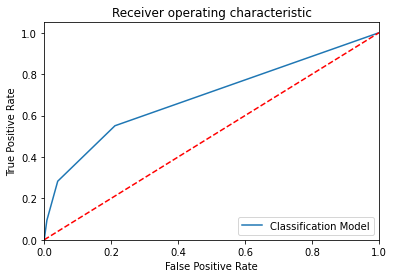

KNN_K_value =  4
Model Name:  KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[  255  1134]
 [  193 10775]]
Outcome values : 
 255 1134 193 10775
Classification report : 
               precision    recall  f1-score   support

           1       0.57      0.18      0.28      1389
           0       0.90      0.98      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.74      0.58      0.61     12357
weighted avg       0.87      0.89      0.87     12357

Accuracy : 89.3 %
Precision : 56.9 %
Recall : 18.4 %
F1 Score : 0.278
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 58.3 %
MCC : 0.28
roc_auc_score: 0.583


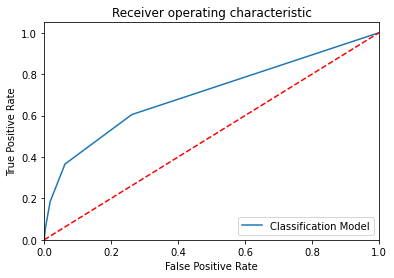

KNN_K_value =  5
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[  369  1020]
 [  316 10652]]
Outcome values : 
 369 1020 316 10652
Classification report : 
               precision    recall  f1-score   support

           1       0.54      0.27      0.36      1389
           0       0.91      0.97      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.73      0.62      0.65     12357
weighted avg       0.87      0.89      0.88     12357

Accuracy : 89.2 %
Precision : 53.9 %
Recall : 26.6 %
F1 Score : 0.356
Specificity or True Negative Rate : 97.1 %
Balanced Accuracy : 61.8 %
MCC : 0.327
roc_auc_score: 0.618


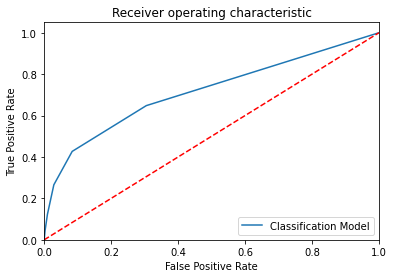

KNN_K_value =  6
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[  269  1120]
 [  187 10781]]
Outcome values : 
 269 1120 187 10781
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.19      0.29      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.75      0.59      0.62     12357
weighted avg       0.87      0.89      0.87     12357

Accuracy : 89.4 %
Precision : 59.0 %
Recall : 19.4 %
F1 Score : 0.292
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 58.8 %
MCC : 0.296
roc_auc_score: 0.588


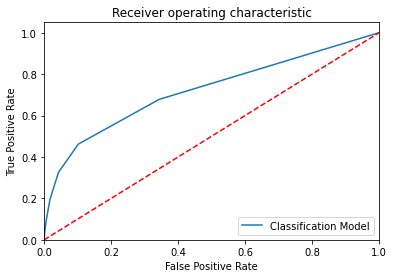

KNN_K_value =  7
Model Name:  KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[  356  1033]
 [  292 10676]]
Outcome values : 
 356 1033 292 10676
Classification report : 
               precision    recall  f1-score   support

           1       0.55      0.26      0.35      1389
           0       0.91      0.97      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.73      0.61      0.65     12357
weighted avg       0.87      0.89      0.88     12357

Accuracy : 89.3 %
Precision : 54.9 %
Recall : 25.6 %
F1 Score : 0.35
Specificity or True Negative Rate : 97.3 %
Balanced Accuracy : 61.4 %
MCC : 0.325
roc_auc_score: 0.615


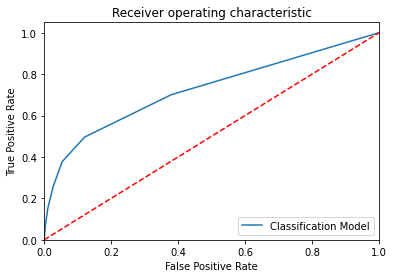

KNN_K_value =  8
Model Name:  KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[  289  1100]
 [  198 10770]]
Outcome values : 
 289 1100 198 10770
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.21      0.31      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.75      0.60      0.63     12357
weighted avg       0.87      0.89      0.87     12357

Accuracy : 89.5 %
Precision : 59.3 %
Recall : 20.8 %
F1 Score : 0.308
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 59.5 %
MCC : 0.308
roc_auc_score: 0.595


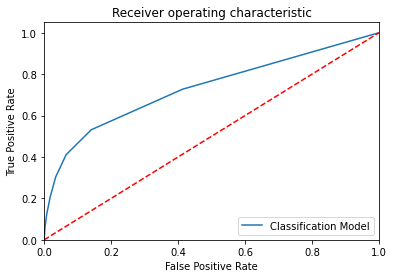

KNN_K_value =  9
Model Name:  KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[  343  1046]
 [  261 10707]]
Outcome values : 
 343 1046 261 10707
Classification report : 
               precision    recall  f1-score   support

           1       0.57      0.25      0.34      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.74      0.61      0.64     12357
weighted avg       0.87      0.89      0.88     12357

Accuracy : 89.4 %
Precision : 56.8 %
Recall : 24.7 %
F1 Score : 0.344
Specificity or True Negative Rate : 97.6 %
Balanced Accuracy : 61.1 %
MCC : 0.327
roc_auc_score: 0.612


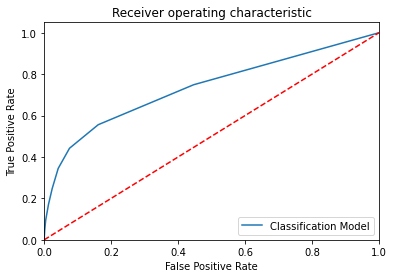

KNN_K_value =  10
Model Name:  KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[  292  1097]
 [  197 10771]]
Outcome values : 
 292 1097 197 10771
Classification report : 
               precision    recall  f1-score   support

           1       0.60      0.21      0.31      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.75      0.60      0.63     12357
weighted avg       0.87      0.90      0.87     12357

Accuracy : 89.5 %
Precision : 59.7 %
Recall : 21.0 %
F1 Score : 0.311
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 59.6 %
MCC : 0.312
roc_auc_score: 0.596


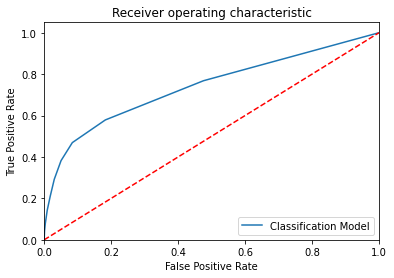

KNN_K_value =  11
Model Name:  KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[  337  1052]
 [  244 10724]]
Outcome values : 
 337 1052 244 10724
Classification report : 
               precision    recall  f1-score   support

           1       0.58      0.24      0.34      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.75      0.61      0.64     12357
weighted avg       0.87      0.90      0.88     12357

Accuracy : 89.5 %
Precision : 58.0 %
Recall : 24.3 %
F1 Score : 0.342
Specificity or True Negative Rate : 97.8 %
Balanced Accuracy : 61.0 %
MCC : 0.329
roc_auc_score: 0.61


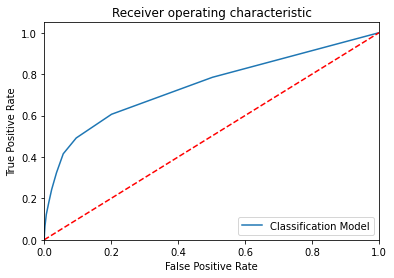

KNN_K_value =  12
Model Name:  KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[  293  1096]
 [  191 10777]]
Outcome values : 
 293 1096 191 10777
Classification report : 
               precision    recall  f1-score   support

           1       0.61      0.21      0.31      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.76      0.60      0.63     12357
weighted avg       0.87      0.90      0.87     12357

Accuracy : 89.6 %
Precision : 60.5 %
Recall : 21.1 %
F1 Score : 0.313
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 59.7 %
MCC : 0.315
roc_auc_score: 0.597


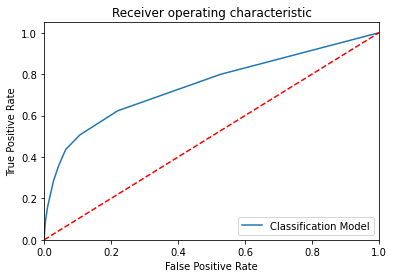

KNN_K_value =  13
Model Name:  KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[  335  1054]
 [  233 10735]]
Outcome values : 
 335 1054 233 10735
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.24      0.34      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.75      0.61      0.64     12357
weighted avg       0.87      0.90      0.88     12357

Accuracy : 89.6 %
Precision : 59.0 %
Recall : 24.1 %
F1 Score : 0.342
Specificity or True Negative Rate : 97.9 %
Balanced Accuracy : 61.0 %
MCC : 0.332
roc_auc_score: 0.61


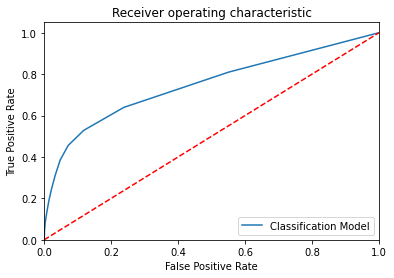

KNN_K_value =  14
Model Name:  KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[  295  1094]
 [  188 10780]]
Outcome values : 
 295 1094 188 10780
Classification report : 
               precision    recall  f1-score   support

           1       0.61      0.21      0.32      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.76      0.60      0.63     12357
weighted avg       0.87      0.90      0.87     12357

Accuracy : 89.6 %
Precision : 61.1 %
Recall : 21.2 %
F1 Score : 0.315
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 59.8 %
MCC : 0.318
roc_auc_score: 0.598


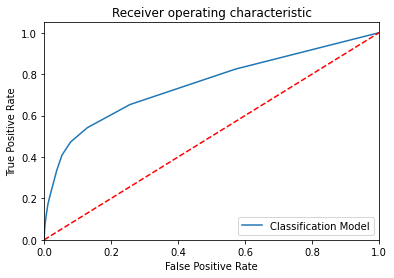

KNN_K_value =  15
Model Name:  KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[  335  1054]
 [  225 10743]]
Outcome values : 
 335 1054 225 10743
Classification report : 
               precision    recall  f1-score   support

           1       0.60      0.24      0.34      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.75      0.61      0.64     12357
weighted avg       0.88      0.90      0.88     12357

Accuracy : 89.6 %
Precision : 59.8 %
Recall : 24.1 %
F1 Score : 0.344
Specificity or True Negative Rate : 97.9 %
Balanced Accuracy : 61.0 %
MCC : 0.335
roc_auc_score: 0.61


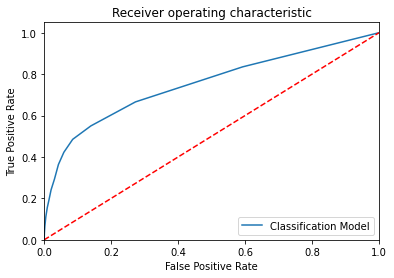

KNN_K_value =  16
Model Name:  KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[  305  1084]
 [  191 10777]]
Outcome values : 
 305 1084 191 10777
Classification report : 
               precision    recall  f1-score   support

           1       0.61      0.22      0.32      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.76      0.60      0.63     12357
weighted avg       0.88      0.90      0.87     12357

Accuracy : 89.7 %
Precision : 61.5 %
Recall : 22.0 %
F1 Score : 0.324
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 60.2 %
MCC : 0.325
roc_auc_score: 0.601


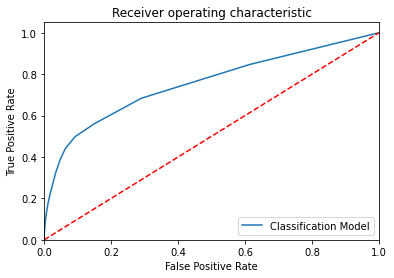

KNN_K_value =  17
Model Name:  KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[  329  1060]
 [  229 10739]]
Outcome values : 
 329 1060 229 10739
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.24      0.34      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.75      0.61      0.64     12357
weighted avg       0.87      0.90      0.88     12357

Accuracy : 89.6 %
Precision : 59.0 %
Recall : 23.7 %
F1 Score : 0.338
Specificity or True Negative Rate : 97.9 %
Balanced Accuracy : 60.8 %
MCC : 0.329
roc_auc_score: 0.608


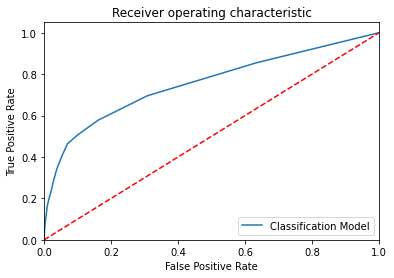

KNN_K_value =  18
Model Name:  KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[  310  1079]
 [  193 10775]]
Outcome values : 
 310 1079 193 10775
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.22      0.33      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.76      0.60      0.64     12357
weighted avg       0.88      0.90      0.87     12357

Accuracy : 89.7 %
Precision : 61.6 %
Recall : 22.3 %
F1 Score : 0.328
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 60.2 %
MCC : 0.329
roc_auc_score: 0.603


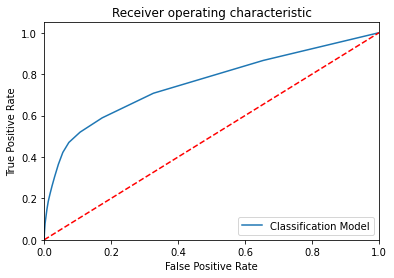

KNN_K_value =  19
Model Name:  KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[  338  1051]
 [  214 10754]]
Outcome values : 
 338 1051 214 10754
Classification report : 
               precision    recall  f1-score   support

           1       0.61      0.24      0.35      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.76      0.61      0.65     12357
weighted avg       0.88      0.90      0.88     12357

Accuracy : 89.8 %
Precision : 61.2 %
Recall : 24.3 %
F1 Score : 0.348
Specificity or True Negative Rate : 98.0 %
Balanced Accuracy : 61.1 %
MCC : 0.342
roc_auc_score: 0.612


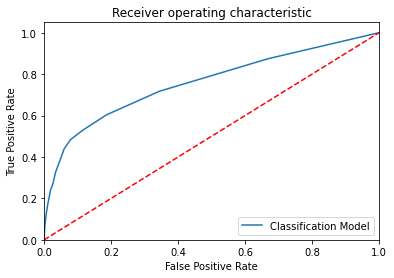

KNN_K_value =  20
Model Name:  KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[  314  1075]
 [  187 10781]]
Outcome values : 
 314 1075 187 10781
Classification report : 
               precision    recall  f1-score   support

           1       0.63      0.23      0.33      1389
           0       0.91      0.98      0.94     10968

    accuracy                           0.90     12357
   macro avg       0.77      0.60      0.64     12357
weighted avg       0.88      0.90      0.88     12357

Accuracy : 89.8 %
Precision : 62.7 %
Recall : 22.6 %
F1 Score : 0.332
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 60.4 %
MCC : 0.335
roc_auc_score: 0.605


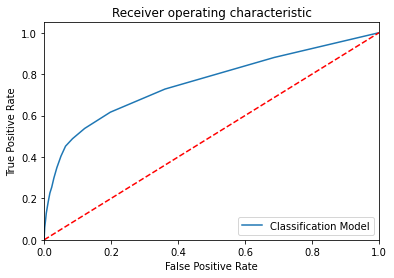

In [34]:
# Bild KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):
    
    k = a
    
    # Build the model
    
    ModelKNN = KNeighborsClassifier(n_neighbors=k)
    
    # Train the model
    
    ModelKNN.fit(x_train, y_train)
    
    # Predict the model
    
    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)
    
    print('KNN_K_value = ', a)
    
    # Print the model name
    
    print('Model Name: ', ModelKNN)
    
    # confusion matrix in sklearn
    
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    
    # actual values
    
    actual = y_test
    
    # predicted values
    
    predicted = y_pred
    
    # confusion matrix
    
    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    
    # outcome values order in sklearn
    
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)
    
    # classification report for precision, recall f1-score and accuracy
    
    C_Report = classification_report(actual,predicted,labels=[1,0])
    
    print('Classification report : \n', C_Report)
    
    # calculating the metrics
    
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);
    
    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    
    from math import sqrt
    
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)
    
    # Area under ROC curve 
    
    from sklearn.metrics import roc_curve, roc_auc_score
    
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------


In [35]:
# display the final results

Results = pd.DataFrame({'y_A':y_test,'y_P':y_pred})
                      
# merge two dataframes on index of the both dataframes

ResultsFinal = bankdata_bk.merge(Results,left_index=True,right_index=True)



# display 5 records randomly

ResultsFinal.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,y_A,y_P
31327,40,admin.,married,basic.9y,unknown,yes,yes,cellular,may,wed,2,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1,no,0,0
10173,40,blue-collar,married,unknown,no,no,no,telephone,jun,thu,4,999,0,nonexistent,1.4,94.465,-41.8,4.958,5228.1,no,0,0
19040,57,retired,married,professional.course,unknown,yes,no,cellular,aug,tue,1,999,0,nonexistent,1.4,93.444,-36.1,4.968,5228.1,no,0,0
35744,38,technician,single,basic.9y,no,no,no,cellular,may,mon,7,999,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1,no,0,0
31053,52,management,divorced,university.degree,no,no,no,cellular,may,wed,1,999,1,failure,-1.8,92.893,-46.2,1.334,5099.1,yes,1,0


In [36]:
EMResults1 = pd.read_csv(r"C:\dataset\EMResults.csv",header=0)

EMResults1.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


# SVM (Gaussian)

Model Name:  SVM - Gaussian
Confusion matrix : 
 [[ 849  540]
 [1529 9439]]
Outcome values : 
 849 540 1529 9439
Classification report : 
               precision    recall  f1-score   support

           1       0.36      0.61      0.45      1389
           0       0.95      0.86      0.90     10968

    accuracy                           0.83     12357
   macro avg       0.65      0.74      0.68     12357
weighted avg       0.88      0.83      0.85     12357

Accuracy : 83.3 %
Precision : 35.7 %
Recall : 61.1 %
F1 Score : 0.451
Specificity or True Negative Rate : 86.1 %
Balanced Accuracy : 73.6 %
MCC : 0.378
roc_auc_score: 0.736


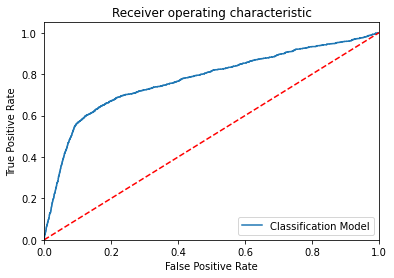

-----------------------------------------------------------------------------------------------------


In [37]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMGaussian = SVC(kernel='rbf', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMGaussian.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMGaussian.predict(x_test)
y_pred_prob = ModelSVMGaussian.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Print the model name
    
print('Model Name: ', "SVM - Gaussian")

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMGaussian.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Gaussian",
            'True_Positive' : tp, 
            'False_Negative' : fn, 
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults1 = EMResults1.append(new_row, ignore_index=True)
#---------------------------------------------------------------------------------------------------------------

In [38]:
EMResults1.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,SVM - Gaussian,849,540,1529,9439,0.833,0.357,0.611,0.451,0.861,0.378,0.735913,0.736


In [39]:
# display the final results

Results = pd.DataFrame({'y_A':y_test,'y_P':y_pred})
                      
# merge two dataframes on index of the both dataframes

ResultsFinal = bankdata_bk.merge(Results,left_index=True,right_index=True)

# display 5 records randomly

ResultsFinal.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,y_A,y_P
22379,33,admin.,single,university.degree,no,no,no,cellular,aug,fri,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no,0,0
33044,33,admin.,married,university.degree,no,yes,no,cellular,may,mon,3,999,0,nonexistent,-1.8,92.893,-46.2,1.299,5099.1,no,0,1
23617,39,admin.,married,university.degree,no,yes,no,cellular,aug,thu,2,999,0,nonexistent,1.4,93.444,-36.1,4.962,5228.1,no,0,0
37975,48,technician,married,professional.course,no,yes,no,cellular,sep,mon,1,999,0,nonexistent,-3.4,92.379,-29.8,0.797,5017.5,no,0,1
3091,58,blue-collar,married,basic.4y,unknown,yes,no,telephone,may,thu,3,999,0,nonexistent,1.1,93.994,-36.4,4.860,5191.0,no,0,0


# Naive Bayes model (GaussianNB)

Confusion matrix : 
 [[ 736  653]
 [1463 9505]]
Outcome values : 
 736 653 1463 9505
Classification report : 
               precision    recall  f1-score   support

           1       0.33      0.53      0.41      1389
           0       0.94      0.87      0.90     10968

    accuracy                           0.83     12357
   macro avg       0.64      0.70      0.66     12357
weighted avg       0.87      0.83      0.84     12357

Accuracy : 82.9 %
Precision : 33.5 %
Recall : 53.0 %
F1 Score : 0.41
Specificity or True Negative Rate : 86.7 %
Balanced Accuracy : 69.8 %
MCC : 0.327
roc_auc_score: 0.698


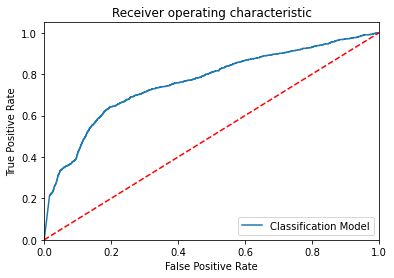

-----------------------------------------------------------------------------------------------------


In [40]:
# Training the Naive Bayes model (GaussianNB) on the Training set

from sklearn.naive_bayes import GaussianNB

modelGNB = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model with train data

modelGNB.fit(x_train,y_train)

# Predict the model with test data set

y_pred = modelGNB.predict(x_test)
y_pred_prob = modelGNB.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,modelGNB.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [41]:
EMResults = pd.read_csv(r"C:\dataset\EMResults.csv",header=0)

EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


# Compare the results

Model Name:  LogisticRegression()
Confusion matrix : 
 [[  304  1085]
 [  155 10813]]
Outcome values : 
 304 1085 155 10813
Classification report : 
               precision    recall  f1-score   support

           1       0.66      0.22      0.33      1389
           0       0.91      0.99      0.95     10968

    accuracy                           0.90     12357
   macro avg       0.79      0.60      0.64     12357
weighted avg       0.88      0.90      0.88     12357

Accuracy : 90.0 %
Precision : 66.2 %
Recall : 21.9 %
F1 Score : 0.329
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 60.2 %
MCC : 0.342
roc_auc_score: 0.602


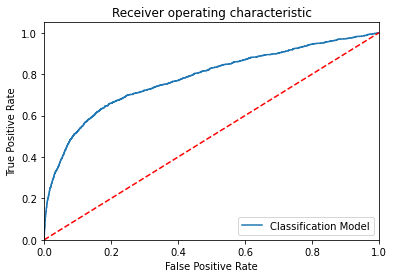

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[ 482  907]
 [1191 9777]]
Outcome values : 
 482 907 1191 9777
Classification report : 
               precision    recall  f1-score   support

           1       0.29      0.35      0.31      1389
           0       0.92      0.89      0.90     10968

    accuracy                           0.83     12357
   macro avg       0.60      0.62      0.61     12357
weighted avg       0.84      0.83      0.84     12357

Accuracy : 83.0 %
Precision : 28.8 %
Recall : 34.7 %
F1 Score : 0.315
Specificity or True Negative Rate : 89.1 %
Balanced Accuracy : 61.9 %
MCC : 0.22
roc_auc_score: 0.619


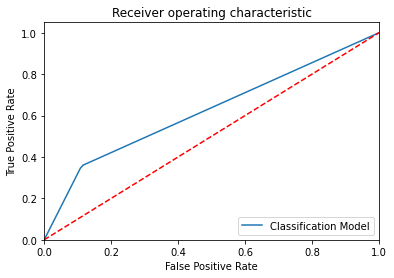

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[  430   959]
 [  374 10594]]
Outcome values : 
 430 959 374 10594
Classification report : 
               precision    recall  f1-score   support

           1       0.53      0.31      0.39      1389
           0       0.92      0.97      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.73      0.64      0.67     12357
weighted avg       0.87      0.89      0.88     12357

Accuracy : 89.2 %
Precision : 53.5 %
Recall : 31.0 %
F1 Score : 0.392
Specificity or True Negative Rate : 96.6 %
Balanced Accuracy : 63.8 %
MCC : 0.353
roc_auc_score: 0.638


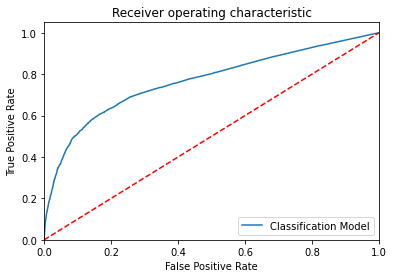

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[  427   962]
 [  485 10483]]
Outcome values : 
 427 962 485 10483
Classification report : 
               precision    recall  f1-score   support

           1       0.47      0.31      0.37      1389
           0       0.92      0.96      0.94     10968

    accuracy                           0.88     12357
   macro avg       0.69      0.63      0.65     12357
weighted avg       0.87      0.88      0.87     12357

Accuracy : 88.3 %
Precision : 46.8 %
Recall : 30.7 %
F1 Score : 0.371
Specificity or True Negative Rate : 95.6 %
Balanced Accuracy : 63.2 %
MCC : 0.318
roc_auc_score: 0.632


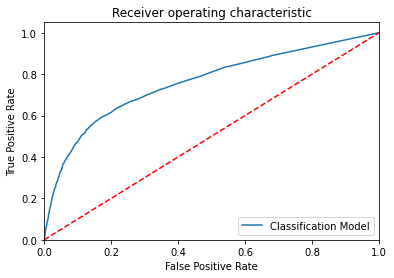

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[  369  1020]
 [  316 10652]]
Outcome values : 
 369 1020 316 10652
Classification report : 
               precision    recall  f1-score   support

           1       0.54      0.27      0.36      1389
           0       0.91      0.97      0.94     10968

    accuracy                           0.89     12357
   macro avg       0.73      0.62      0.65     12357
weighted avg       0.87      0.89      0.88     12357

Accuracy : 89.2 %
Precision : 53.9 %
Recall : 26.6 %
F1 Score : 0.356
Specificity or True Negative Rate : 97.1 %
Balanced Accuracy : 61.8 %
MCC : 0.327
roc_auc_score: 0.618


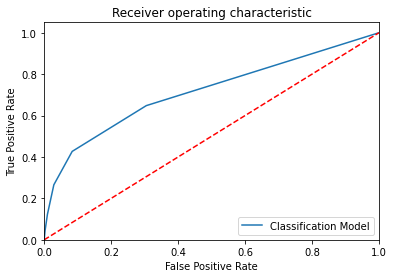

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(class_weight='balanced', kernel='linear', probability=True, random_state=42)
Confusion matrix : 
 [[ 835  554]
 [1509 9459]]
Outcome values : 
 835 554 1509 9459
Classification report : 
               precision    recall  f1-score   support

           1       0.36      0.60      0.45      1389
           0       0.94      0.86      0.90     10968

    accuracy                           0.83     12357
   macro avg       0.65      0.73      0.67     12357
weighted avg       0.88      0.83      0.85     12357

Accuracy : 83.3 %
Precision : 35.6 %
Recall : 60.1 %
F1 Score : 0.447
Specificity or True Negative Rate : 86.2 %
Balanced Accuracy : 73.2 %
MCC : 0.373
roc_auc_score: 0.732


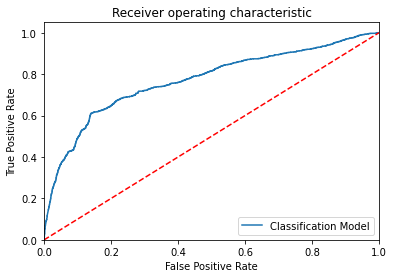

-----------------------------------------------------------------------------------------------------


In [42]:
# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Create objects of classification algorithm with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=5)
ModelSVM = SVC(kernel='linear', random_state = 42, class_weight='balanced', probability=True)

# Evalution matrix for all the algorithms

MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelSVM]

for models in MM:
    
    # Fit the model
    
    models.fit(x_train, y_train)
    
    # Prediction
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #---
    new_row = {'Model Name' : models,
               'True_Positive' : tp, 
               'False_Negative' : fn, 
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults1 = EMResults1.append(new_row, ignore_index=True)
    #------------------------------------------------------------------------------------------------------------------

In [47]:
y_pred=ModelLR.predict(x_test)

In [49]:
# display the final results

Results = pd.DataFrame({'y_A':y_test,'y_P':y_pred})
                      
# merge two dataframes on index of the both dataframes

ResultsFinal = bankdata_bk.merge(Results,left_index=True,right_index=True)

# display 5 records randomly

ResultsFinal.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,y_A,y_P
6809,40,blue-collar,married,basic.4y,no,yes,no,telephone,may,wed,5,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,0,0
32557,43,blue-collar,married,basic.9y,unknown,yes,no,telephone,may,mon,5,999,0,nonexistent,-1.8,92.893,-46.2,1.299,5099.1,no,0,0
34767,38,blue-collar,married,basic.6y,no,yes,no,cellular,may,thu,9,999,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,no,0,0
16253,25,services,single,unknown,no,yes,no,cellular,jul,tue,5,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,yes,1,0
13542,32,technician,married,professional.course,no,yes,no,cellular,jul,thu,1,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,yes,1,0
